In [10]:
import warnings
warnings.filterwarnings('ignore') 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from PIL import Image
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
import torch.optim as optim
import torch.nn.functional as F
import colorama
from colorama import Fore, Style
import datasets

In [6]:
import os
from PIL import Image
import random
from torchvision import transforms

# ----------------------------
# Configuration
 # your main dataset folder
target_size = 1604  # number of images in largest class (rice_bacterial_blight)
save_augmented = True  # save augmented images

# ----------------------------
# Augmentation pipeline
# ----------------------------
augment = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(30),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3),
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0))
])

# ----------------------------
# Iterate through classes
# ----------------------------
for class_name in os.listdir(data_dir):
    class_path = os.path.join(data_dir, class_name)
    if not os.path.isdir(class_path):
        continue

    images = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    num_images = len(images)
    print(f"Class '{class_name}' has {num_images} images.")

    # Skip if already target_size or larger
    if num_images >= target_size:
        continue

    # Number of new images needed
    num_to_create = target_size - num_images

    for i in range(num_to_create):
        # Randomly pick an existing image
        img_name = random.choice(images)
        img_path = os.path.join(class_path, img_name)
        img = Image.open(img_path).convert("RGB")

        # Apply augmentation
        img_aug = augment(img)

        # Save augmented image
        if save_augmented:
            new_name = f"{os.path.splitext(img_name)[0]}_aug_{i}.jpg"
            save_path = os.path.join(class_path, new_name)
            img_aug.save(save_path)

    print(f"Added {num_to_create} augmented images to class '{class_name}'.")


Class 'corn_cercospora_leaf_spot gray_leaf_spot' has 513 images.


Added 1091 augmented images to class 'corn_cercospora_leaf_spot gray_leaf_spot'.
Class 'corn_common_rust' has 1192 images.
Added 412 augmented images to class 'corn_common_rust'.
Class 'corn_healthy' has 1162 images.
Added 442 augmented images to class 'corn_healthy'.
Class 'corn_northern_leaf_blight' has 985 images.
Added 619 augmented images to class 'corn_northern_leaf_blight'.
Class 'rice_bacterial_blight' has 1604 images.
Class 'rice_blast' has 198 images.
Added 1406 augmented images to class 'rice_blast'.
Class 'rice_brown_spot' has 90 images.
Added 1514 augmented images to class 'rice_brown_spot'.
Class 'rice_leaf_scaled' has 143 images.
Added 1461 augmented images to class 'rice_leaf_scaled'.
Class 'rice_leaf_smut' has 1460 images.
Added 144 augmented images to class 'rice_leaf_smut'.
Class 'rice_shath_blight' has 219 images.
Added 1385 augmented images to class 'rice_shath_blight'.
Class 'rice_tungro' has 119 images.
Added 1485 augmented images to class 'rice_tungro'.


In [7]:
data_dir = "../data/leaf/disease"

disease_class = os.listdir(dir)

In [8]:
print(str(disease_class))
print("\nTotal Classes:", len(disease_class))

['corn_cercospora_leaf_spot gray_leaf_spot', 'corn_common_rust', 'corn_healthy', 'corn_northern_leaf_blight', 'rice_bacterial_blight', 'rice_blast', 'rice_brown_spot', 'rice_leaf_scaled', 'rice_leaf_smut', 'rice_shath_blight', 'rice_tungro']

Total Classes: 11



The Number of Images in corn_cercospora_leaf_spot gray_leaf_spot: 1604 
The Number of Images in corn_common_rust: 1604 
The Number of Images in corn_healthy: 1604 
The Number of Images in corn_northern_leaf_blight: 1604 
The Number of Images in rice_bacterial_blight: 1604 
The Number of Images in rice_blast: 1604 
The Number of Images in rice_brown_spot: 1604 
The Number of Images in rice_leaf_scaled: 1604 
The Number of Images in rice_leaf_smut: 1604 
The Number of Images in rice_shath_blight: 1604 
The Number of Images in rice_tungro: 1604 
Total Number of Images in Directory:  17644


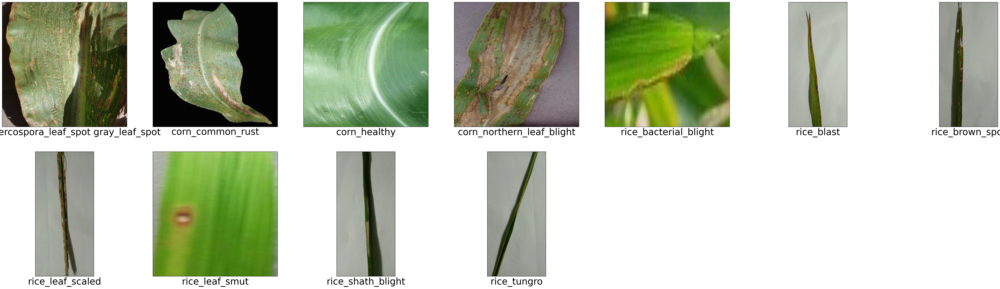

In [11]:
plt.figure(figsize=(60,60), dpi=200)
cnt = 0
plant_names = []
tot_images = 0

for i in disease_class:
    cnt += 1
    plant_names.append(i)
    plt.subplot(7,7,cnt)
    
    image_path = os.listdir(dir + "/" + i)
    print(Fore.WHITE)
    print("The Number of Images in " +i+ ":", len(image_path), end= " ")
    tot_images += len(image_path)
    
    import cv2

    # Load and convert the image to RGB
    img_show = cv2.imread(dir + "/" + i + "/" + image_path[0])
    img_show_rgb = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)

    plt.imshow(img_show_rgb)
    
    # plt.imshow(img_show)
    plt.xlabel(i,fontsize=30)
    plt.xticks([])
    plt.yticks([])
    
    
print("\nTotal Number of Images in Directory: ", tot_images)

In [12]:

model_dir = "./saved_model"
num_classes = 11
batch_size = 32
num_epochs = 15
learning_rate = 0.001
val_split = 0.15
test_split = 0.10
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [13]:
# ----------------------------
# 2. Transforms (augment small classes)
# ----------------------------
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(25),
    transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4),
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

In [14]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, models, transforms
from torch.utils.data import DataLoader, random_split, WeightedRandomSampler
import numpy as np
import os

In [15]:
# 3. Load dataset
# ----------------------------
full_dataset = datasets.ImageFolder(root=dir, transform=train_transform)

# Split dataset
total_size = len(full_dataset)
val_size = int(val_split * total_size)
test_size = int(test_split * total_size)
train_size = total_size - val_size - test_size

train_dataset, val_dataset, test_dataset = random_split(
    full_dataset, [train_size, val_size, test_size],
    generator=torch.Generator().manual_seed(42)
)

val_dataset.dataset.transform = test_transform
test_dataset.dataset.transform = test_transform

In [16]:
# 4. Compute class counts for sampler & loss
# ----------------------------
targets = [full_dataset.targets[i] for i in train_dataset.indices]
class_counts = np.bincount(targets)
class_weights = 1.0 / class_counts  # inverse frequency
samples_weight = [class_weights[t] for t in targets]

sampler = WeightedRandomSampler(
    weights=samples_weight,
    num_samples=len(samples_weight),
    replacement=True
)


In [17]:
train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=sampler, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

In [18]:
# ----------------------------
# 5. Model: Pretrained CNN
# ----------------------------
model = models.resnet50(weights="IMAGENET1K_V1")
for param in model.parameters():
    param.requires_grad = False

num_ftrs = model.fc.in_features
model.fc = nn.Sequential(
    nn.Linear(num_ftrs, 512),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(512, num_classes)
)
model = model.to(device)

In [19]:
# ----------------------------
# 6. Loss (weighted by class frequency)
# ----------------------------
class_weights_tensor = torch.FloatTensor(class_weights).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(model.fc.parameters(), lr=learning_rate)

In [20]:
# ----------------------------
# 7. Training
# ----------------------------
for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")
    print("-" * 40)

    model.train()
    train_loss, train_correct = 0.0, 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * images.size(0)
        train_correct += torch.sum(preds == labels.data)

    train_loss /= len(train_dataset)
    train_acc = train_correct.double() / len(train_dataset)
    print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f}")

    # ---- Validation ----
    model.eval()
    val_loss, val_correct = 0.0, 0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            val_correct += torch.sum(preds == labels.data)

    val_loss /= len(val_dataset)
    val_acc = val_correct.double() / len(val_dataset)
    print(f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}")

# ----------------------------
# 8. Test Evaluation
# ----------------------------
model.eval()
correct, total = 0, 0
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        correct += torch.sum(preds == labels).item()
        total += labels.size(0)
print(f"\n✅ Test Accuracy: {100 * correct / total:.2f}%")



Epoch 1/15
----------------------------------------
Train Loss: 0.8088 | Train Acc: 0.6924
Val Loss: 0.5338 | Val Acc: 0.7944

Epoch 2/15
----------------------------------------
Train Loss: 0.5956 | Train Acc: 0.7669
Val Loss: 0.4592 | Val Acc: 0.8273

Epoch 3/15
----------------------------------------
Train Loss: 0.5437 | Train Acc: 0.7911
Val Loss: 0.4716 | Val Acc: 0.8235

Epoch 4/15
----------------------------------------
Train Loss: 0.5178 | Train Acc: 0.8028
Val Loss: 0.4383 | Val Acc: 0.8367

Epoch 5/15
----------------------------------------
Train Loss: 0.5059 | Train Acc: 0.8068
Val Loss: 0.4435 | Val Acc: 0.8299

Epoch 6/15
----------------------------------------
Train Loss: 0.4729 | Train Acc: 0.8155
Val Loss: 0.4304 | Val Acc: 0.8394

Epoch 7/15
----------------------------------------
Train Loss: 0.4577 | Train Acc: 0.8196
Val Loss: 0.4467 | Val Acc: 0.8311

Epoch 8/15
----------------------------------------
Train Loss: 0.4588 | Train Acc: 0.8217
Val Loss: 0.4031 | 

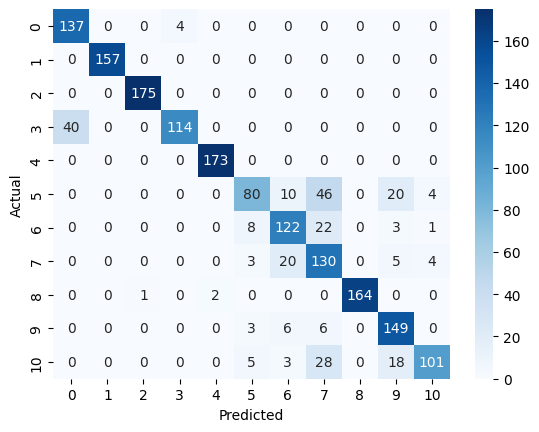

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

all_preds, all_labels = [], []
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(all_labels, all_preds)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


In [24]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

all_preds, all_labels = [], []
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

cm = confusion_matrix(all_labels, all_preds)
cm

array([[137,   0,   0,   4,   0,   0,   0,   0,   0,   0,   0],
       [  0, 157,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0, 175,   0,   0,   0,   0,   0,   0,   0,   0],
       [ 40,   0,   0, 114,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0, 173,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,  80,  10,  46,   0,  20,   4],
       [  0,   0,   0,   0,   0,   8, 122,  22,   0,   3,   1],
       [  0,   0,   0,   0,   0,   3,  20, 130,   0,   5,   4],
       [  0,   0,   1,   0,   2,   0,   0,   0, 164,   0,   0],
       [  0,   0,   0,   0,   0,   3,   6,   6,   0, 149,   0],
       [  0,   0,   0,   0,   0,   5,   3,  28,   0,  18, 101]],
      dtype=int64)

In [25]:
import numpy as np

# Your confusion matrix


classwise_acc = cm.diagonal() / cm.sum(axis=
                                       1) * 100
for i, acc in enumerate(classwise_acc):
    print(f"Class {i} Accuracy: {acc:.2f}%")


Class 0 Accuracy: 97.16%
Class 1 Accuracy: 100.00%
Class 2 Accuracy: 100.00%
Class 3 Accuracy: 74.03%
Class 4 Accuracy: 100.00%
Class 5 Accuracy: 50.00%
Class 6 Accuracy: 78.21%
Class 7 Accuracy: 80.25%
Class 8 Accuracy: 98.20%
Class 9 Accuracy: 90.85%
Class 10 Accuracy: 65.16%


In [26]:
import torch
from sklearn.metrics import classification_report, confusion_matrix, f1_score, top_k_accuracy_score
import numpy as np

# Put model in evaluation mode
model.eval()

all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# 1. Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
print("Confusion Matrix:\n", cm)

# 2. Class-wise Precision, Recall, F1-score
print("\nClassification Report:\n")
print(classification_report(all_labels, all_preds, digits=4))

# 3. Macro and Micro F1-score
macro_f1 = f1_score(all_labels, all_preds, average='macro')
micro_f1 = f1_score(all_labels, all_preds, average='micro')
print(f"Macro F1-score: {macro_f1:.4f}")
print(f"Micro F1-score: {micro_f1:.4f}")

# 4. Top-1 and Top-3 Accuracy
# Get raw logits for top-k
all_logits = []
with torch.no_grad():
    for images, _ in test_loader:
        images = images.to(device)
        outputs = model(images)
        all_logits.extend(outputs.cpu().numpy())
all_logits = np.array(all_logits)

top1_acc = top_k_accuracy_score(all_labels, all_logits, k=1)
top3_acc = top_k_accuracy_score(all_labels, all_logits, k=3)
print(f"Top-1 Accuracy: {top1_acc*100:.2f}%")
print(f"Top-3 Accuracy: {top3_acc*100:.2f}%")


Confusion Matrix:
 [[137   0   0   4   0   0   0   0   0   0   0]
 [  0 157   0   0   0   0   0   0   0   0   0]
 [  0   0 175   0   0   0   0   0   0   0   0]
 [ 40   0   0 114   0   0   0   0   0   0   0]
 [  0   0   0   0 173   0   0   0   0   0   0]
 [  0   0   0   0   0  80  10  46   0  20   4]
 [  0   0   0   0   0   8 122  22   0   3   1]
 [  0   0   0   0   0   3  20 130   0   5   4]
 [  0   0   1   0   2   0   0   0 164   0   0]
 [  0   0   0   0   0   3   6   6   0 149   0]
 [  0   0   0   0   0   5   3  28   0  18 101]]

Classification Report:

              precision    recall  f1-score   support

           0     0.7740    0.9716    0.8616       141
           1     1.0000    1.0000    1.0000       157
           2     0.9943    1.0000    0.9972       175
           3     0.9661    0.7403    0.8382       154
           4     0.9886    1.0000    0.9943       173
           5     0.8081    0.5000    0.6178       160
           6     0.7578    0.7821    0.7697       156
     

In [61]:
train = ImageFolder(train_dir, transform=train_transform)
valid = ImageFolder(valid_dir, transform=val_transform) 

In [62]:
train

Dataset ImageFolder
    Number of datapoints: 1900
    Root location: ../data/leaf//raw/processed_train
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
               Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
           )

In [63]:
train[0]

(tensor([[[ 0.1843,  0.1843,  0.1843,  ...,  0.1529,  0.1529,  0.1529],
          [ 0.1843,  0.1843,  0.1843,  ...,  0.1529,  0.1529,  0.1529],
          [ 0.1843,  0.1843,  0.1843,  ...,  0.1529,  0.1529,  0.1529],
          ...,
          [ 0.2549,  0.2549,  0.2471,  ..., -0.1216, -0.1216, -0.1216],
          [ 0.2941,  0.3020,  0.2941,  ..., -0.1216, -0.1216, -0.1216],
          [ 0.3098,  0.3176,  0.3176,  ..., -0.1216, -0.1216, -0.1216]],
 
         [[ 0.1843,  0.1843,  0.1843,  ...,  0.1529,  0.1529,  0.1529],
          [ 0.1843,  0.1843,  0.1843,  ...,  0.1529,  0.1529,  0.1529],
          [ 0.1843,  0.1843,  0.1843,  ...,  0.1529,  0.1529,  0.1529],
          ...,
          [ 0.2549,  0.2549,  0.2471,  ..., -0.1216, -0.1216, -0.1216],
          [ 0.2941,  0.3020,  0.2941,  ..., -0.1216, -0.1216, -0.1216],
          [ 0.3098,  0.3176,  0.3176,  ..., -0.1216, -0.1216, -0.1216]],
 
         [[ 0.1843,  0.1843,  0.1843,  ...,  0.1529,  0.1529,  0.1529],
          [ 0.1843,  0.1843,

In [64]:
img, label = train[0]
print(img.shape, label)

torch.Size([3, 224, 224]) 0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.84313726..0.67058825].



Label :Apple___Apple_scab(0)



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.26274514].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.92156863..1.0].


Label :Apple___Cedar_apple_rust(2)

Label :Blueberry___healthy(4)


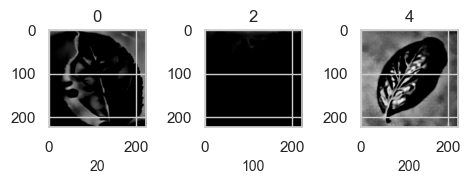

In [65]:
def show_image(image, label):
    print("Label :" + train.classes[label] + "(" + str(label) + ")")
    plt.imshow(image.permute(1, 2, 0))
    
    
image_list = [20,100,200]
# batch_size = 32
chs = 0
for img in image_list:
    chs += 1
    plt.subplot(2,4,chs)
    print(Fore.GREEN)
    plt.tight_layout()
    plt.xlabel(img,fontsize=10)
    plt.title(train[img][1])
    show_image(*train[img])

In [66]:
# DataLoaders for training and validation
train_dataloader = DataLoader(train, batch_size = 32, shuffle=True, num_workers=2, pin_memory=True)
valid_dataloader = DataLoader(valid, batch_size = 32, num_workers=2, pin_memory=True)

In [67]:
# for moving data into GPU (if available)
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available:
        return torch.device("cuda")
    else:
        return torch.device("cpu")

In [68]:
# for moving data to device (CPU or GPU)
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

In [69]:
# for loading in the device (GPU if available else CPU)
class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dataloader, device):
        self.dataloader = dataloader
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dataloader:
            yield to_device(b, self.device)
        
    def __len__(self):
        """Number of batches"""
        return len(self.dataloader)

In [70]:
# device = get_default_device()
# device

In [71]:
# # Set device (CUDA if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device




device(type='cuda')

In [72]:
# Moving data into GPU, WrappedDataLoader
train_dataloader = DeviceDataLoader(train_dataloader, device)
valid_dataloader = DeviceDataLoader(valid_dataloader, device)

In [73]:
# for calculating the accuracy
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

In [74]:
class ImageClassificationBase(nn.Module):
    
    def training_step(self, batch):
        images, labels = batch 
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss
    
    def validation_step(self, batch):
        images, labels = batch 
        out = self(images)                    # Generate predictions
        loss = F.cross_entropy(out, labels)   # Calculate loss
        acc = accuracy(out, labels)           # Calculate accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}
        
    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}
    
    def epoch_end(self, epoch, result):
        print("Epoch [{}], train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, result['train_loss'], result['val_loss'], result['val_acc']))

In [75]:
# convolution block with BatchNormalization
def ConvBlock(in_channels, out_channels, pool=False):
    layers = [nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
             nn.BatchNorm2d(out_channels),
             nn.ReLU(inplace=True)]
    if pool:
        layers.append(nn.MaxPool2d(4))
    return nn.Sequential(*layers)

In [76]:
# resnet architecture 
import torch
import torch.nn as nn
import torch.nn.functional as F
class CNN_NeuralNet(ImageClassificationBase):


    def __init__(self, input_channels, num_classes):
        super(CNN_NeuralNet, self).__init__()
        # Define the layers of the CNN
        self.conv1 = nn.Conv2d(input_channels, 64, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)  # Pooling layer
        
        # Assuming input size of 224x224
        self.fc1 = nn.Linear(256 * 28 * 28, 512)  # Adjust according to input size after convolutions
        self.fc2 = nn.Linear(512, num_classes)  # Output layer with num_classes neurons

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))
        x = x.view(-1, 256 * 28 * 28)  # Flatten the tensor (adjust size if needed)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)  # Output layer
        return x


In [77]:
# defining the model and moving it to the GPU
# 3 is number of channels RGB, len(train.classes()) is number of diseases.
model = to_device(CNN_NeuralNet(3, len(train.classes)), device) 
model

CNN_NeuralNet(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=200704, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=38, bias=True)
)

In [78]:
import torch
print(torch.cuda.is_available())  # Should return True if CUDA is accessible
print(torch.cuda.device_count())  # Shows number of GPUs available
print(torch.cuda.get_device_name(0)) if torch.cuda.is_available() else print("No CUDA device")


True
1
NVIDIA GeForce GTX 1650


In [79]:
# for training
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)

In [80]:
import torch
import time
from torch import nn
from torch.optim import AdamW, SGD, RMSprop
from torch.optim.lr_scheduler import ReduceLROnPlateau
from itertools import product

# Hyperparameter grid for tuning
lr_rates = [1e-3, 5e-4]
weight_decays = [0.0, 1e-4]
optimizers = [AdamW, SGD]
grad_clips = [None, 0.1,]



# # Hyperparameter grid for tuning
# lr_rates = [1e-3, 5e-4, 1e-4]
# weight_decays = [0.0, 1e-4, 1e-3]
# optimizers = [AdamW, SGD, RMSprop]
# grad_clips = [None, 0.1, 0.2]





# Loss function
criterion = nn.CrossEntropyLoss()

def train_single_epoch(model, train_loader, optimizer, grad_clip=None):
    model.train()
    train_loss = 0.0
    
    for batch in train_loader:
        inputs, labels = batch
        if torch.cuda.is_available():
            inputs, labels = inputs.cuda(), labels.cuda()
            
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        
        loss.backward()
        
        # Apply gradient clipping if set
        if grad_clip:
            nn.utils.clip_grad_norm_(model.parameters(), grad_clip)
        
        optimizer.step()
        train_loss += loss.item()
    
    return train_loss / len(train_loader)


def evaluate_model(model, val_loader):
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for batch in val_loader:
            inputs, labels = batch
            if torch.cuda.is_available():
                inputs, labels = inputs.cuda(), labels.cuda()
                
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
    
    return val_loss / len(val_loader)


# Grid Search Training Function
def train_with_tuning(model, train_loader, val_loader, num_epochs=5):
    best_model = None
    best_val_loss = float('inf')
    best_params = {}
    
    # Iterate over all combinations of hyperparameters
    for lr, weight_decay, opt_func, grad_clip in product(lr_rates, weight_decays, optimizers, grad_clips):
        print(f"\nTraining with LR={lr}, Weight Decay={weight_decay}, Optimizer={opt_func.__name__}, Grad Clip={grad_clip}")
        
        # Create optimizer
        optimizer = opt_func(model.parameters(), lr=lr, weight_decay=weight_decay)
        scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2, verbose=False)
        
        # Track loss
        import time
from datetime import timedelta

def train_with_tuning(model, train_loader, val_loader, num_epochs=5):
    best_model = None
    best_val_loss = float('inf')
    best_params = {}
    
    for lr, weight_decay, opt_func, grad_clip in product(lr_rates, weight_decays, optimizers, grad_clips):
        print(f"\nTraining with LR={lr}, Weight Decay={weight_decay}, Optimizer={opt_func.__name__}, Grad Clip={grad_clip}")
        
        optimizer = opt_func(model.parameters(), lr=lr, weight_decay=weight_decay)
        scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2, verbose=False)
        
        for epoch in range(num_epochs):
            start_time = time.time()

            train_loss = train_single_epoch(model, train_loader, optimizer, grad_clip)
            val_loss = evaluate_model(model, val_loader)
            scheduler.step(val_loss)
            
            elapsed_time = time.time() - start_time
            remaining_epochs = (num_epochs - epoch - 1)
            estimated_remaining_time = timedelta(seconds=remaining_epochs * elapsed_time)

            print(f"Epoch {epoch + 1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
                  f"Time per Epoch: {elapsed_time:.2f}s, Estimated Time Remaining: {estimated_remaining_time}")
        
        # Check for the best model
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model = model.state_dict()
            best_params = {"lr": lr, "weight_decay": weight_decay, "optimizer": opt_func.__name__, "grad_clip": grad_clip}
    
    model.load_state_dict(best_model)
    print("\nBest Hyperparameters:", best_params)
    return model, best_params


In [81]:
# %%time
# history = [evaluate(model, valid_dataloader)]
# history

In [82]:
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']


In [ ]:
model, best_params = train_with_tuning(model, train_dataloader, valid_dataloader, num_epochs=10)



Training with LR=0.001, Weight Decay=0.0, Optimizer=AdamW, Grad Clip=None


KeyboardInterrupt: 

In [36]:
torch.save(best_params, '../models/1_epoch2_hp_ht_best_model.pth')


In [37]:
torch.save(model.state_dict(), '../models/1_epoch2_hp_ht_best_model_state.pth')


In [39]:
torch.save(best_params, '../models/ht_best_model.pth')
print("Best model saved as 'best_model.pth'")

Best model saved as 'best_model.pth'


In [44]:
def predict_image(img, model):
    """Converts image to array and return the predicted class
        with highest probability"""
    # Convert to a batch of 1
    xb = to_device(img.unsqueeze(0), device)
    # Get predictions from model
    yb = model(xb)
    # Pick index with highest probability
    _, preds  = torch.max(yb, dim=1)
    # Retrieve the class label

    return train.classes[preds[0].item()]

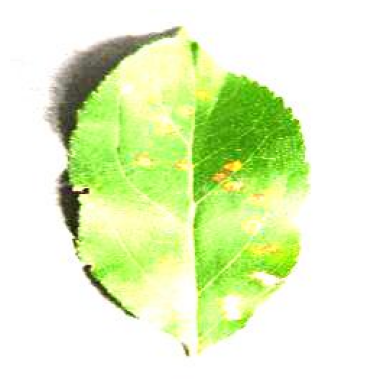

Actual Label: AppleCedarRust1 - Copy.JPG
Predicted: 17


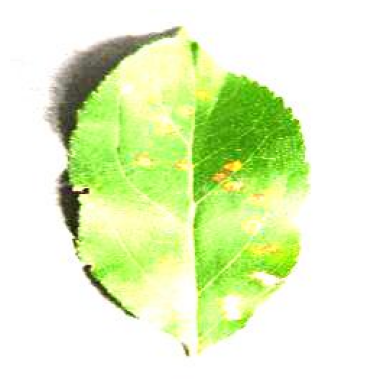

Actual Label: AppleCedarRust1.JPG
Predicted: 17


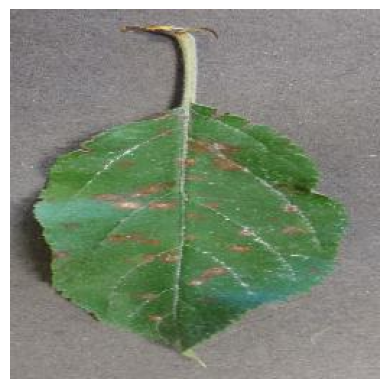

Actual Label: AppleCedarRust2.JPG
Predicted: 17


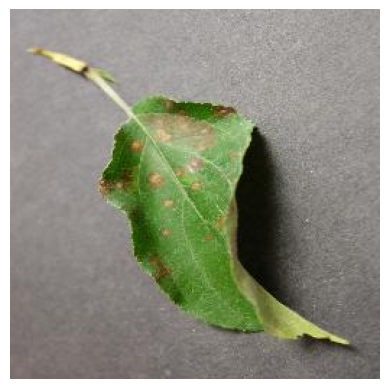

Actual Label: AppleCedarRust3.JPG
Predicted: 17


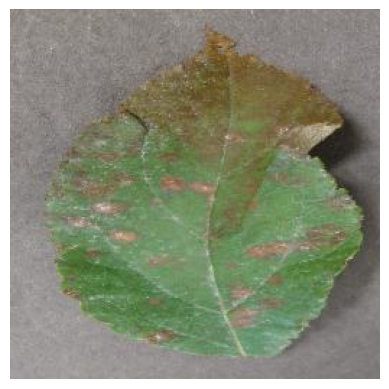

Actual Label: AppleCedarRust4.JPG
Predicted: 17


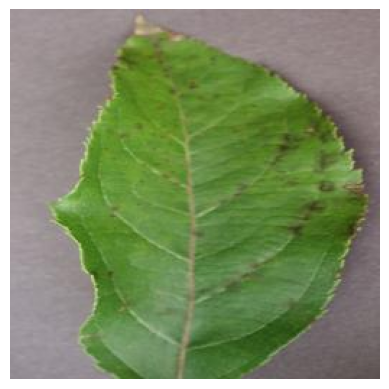

Actual Label: AppleScab1.JPG
Predicted: 17


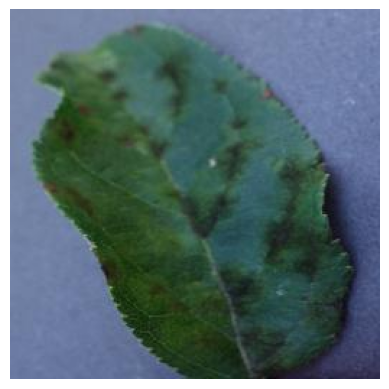

Actual Label: AppleScab2.JPG
Predicted: 17


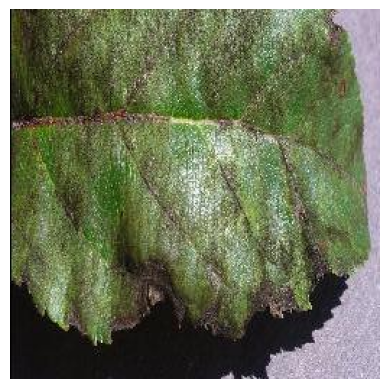

Actual Label: AppleScab3.JPG
Predicted: 17


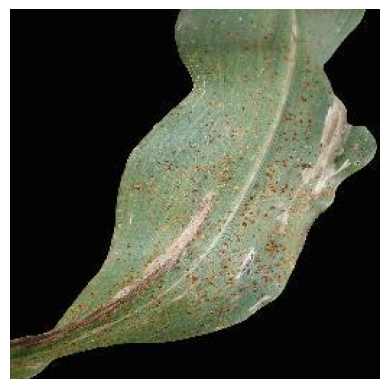

Actual Label: CornCommonRust1.JPG
Predicted: 17


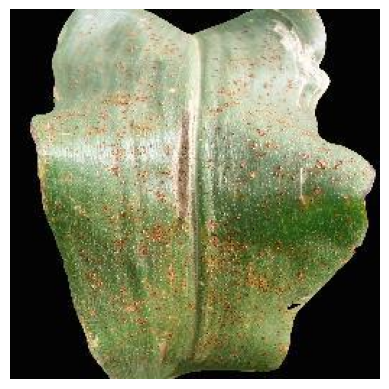

Actual Label: CornCommonRust2.JPG
Predicted: 17


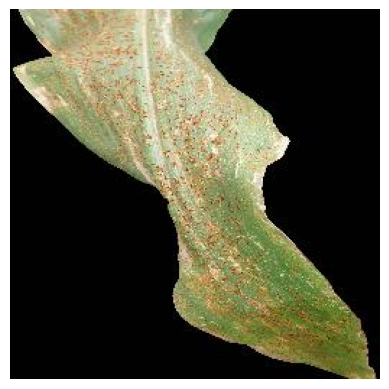

Actual Label: CornCommonRust3.JPG
Predicted: 17


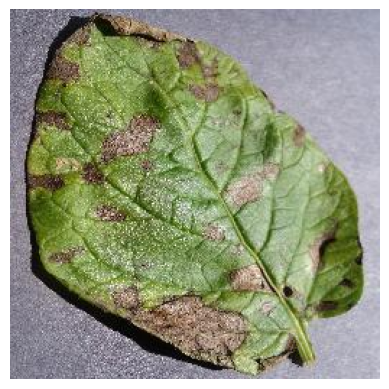

Actual Label: PotatoEarlyBlight1.JPG
Predicted: 17


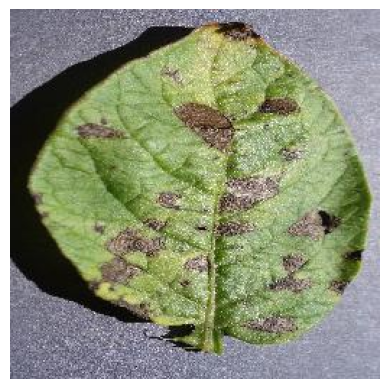

Actual Label: PotatoEarlyBlight2.JPG
Predicted: 17


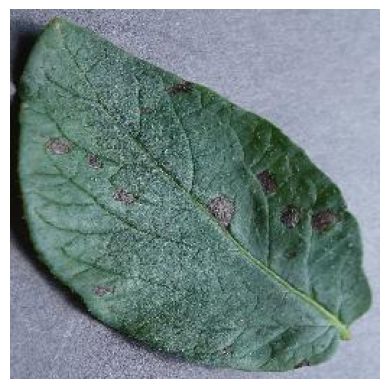

Actual Label: PotatoEarlyBlight3.JPG
Predicted: 17


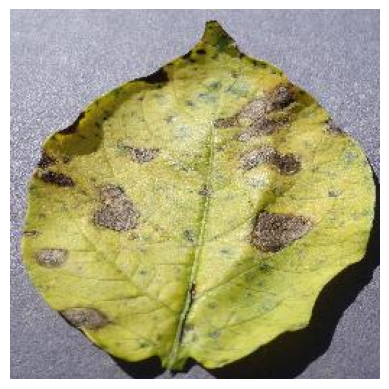

Actual Label: PotatoEarlyBlight4.JPG
Predicted: 17


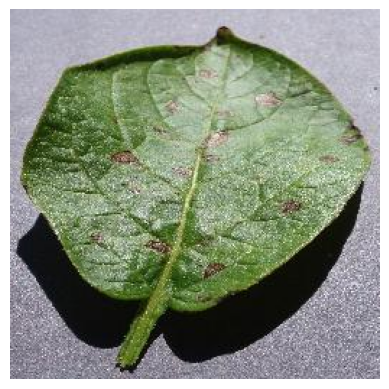

Actual Label: PotatoEarlyBlight5.JPG
Predicted: 17


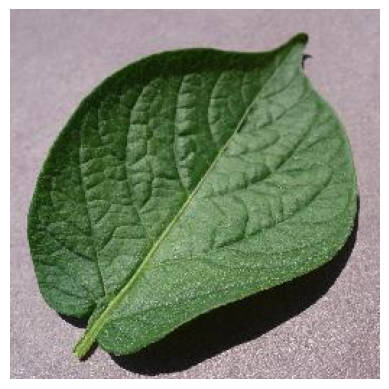

Actual Label: PotatoHealthy2.JPG
Predicted: 17


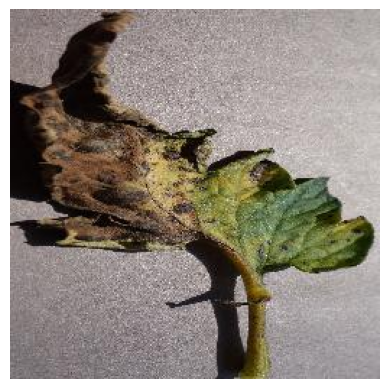

Actual Label: TomatoEarlyBlight1.JPG
Predicted: 17


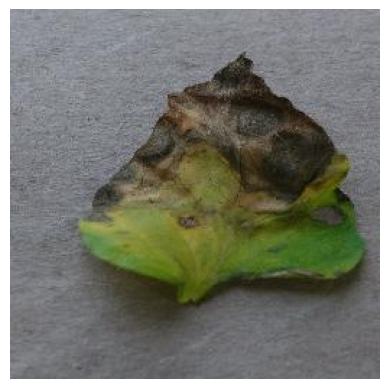

Actual Label: TomatoEarlyBlight2.JPG
Predicted: 17


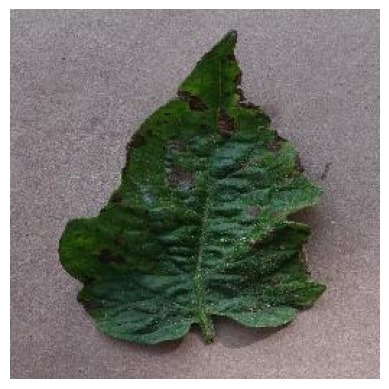

Actual Label: TomatoEarlyBlight3.JPG
Predicted: 17


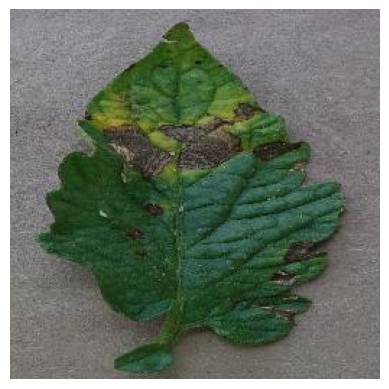

Actual Label: TomatoEarlyBlight4.JPG
Predicted: 17


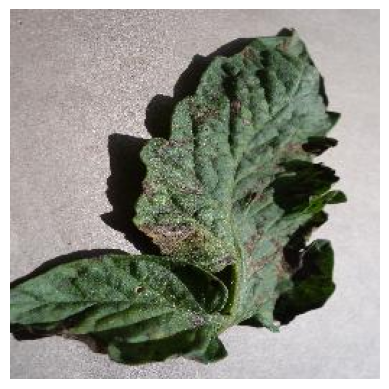

Actual Label: TomatoEarlyBlight5.JPG
Predicted: 17


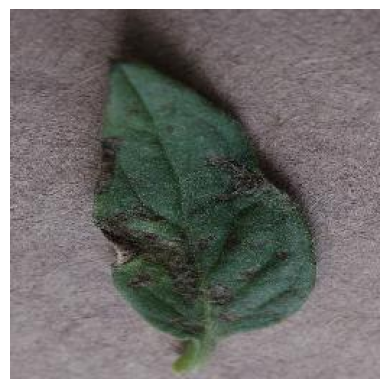

Actual Label: TomatoEarlyBlight6.JPG
Predicted: 17


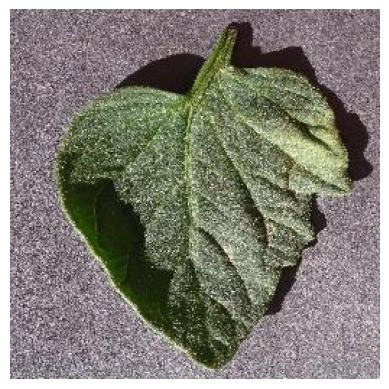

Actual Label: TomatoHealthy1.JPG
Predicted: 17


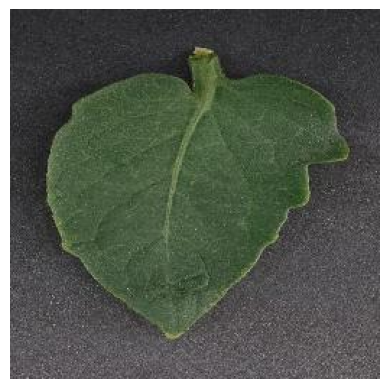

Actual Label: TomatoHealthy2.JPG
Predicted: 17


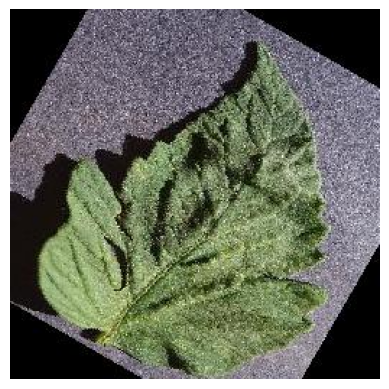

Actual Label: TomatoHealthy3.JPG
Predicted: 17


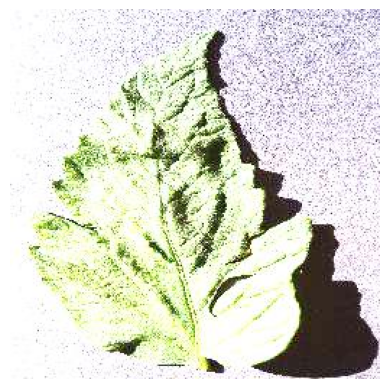

Actual Label: TomatoHealthy4.JPG
Predicted: 17


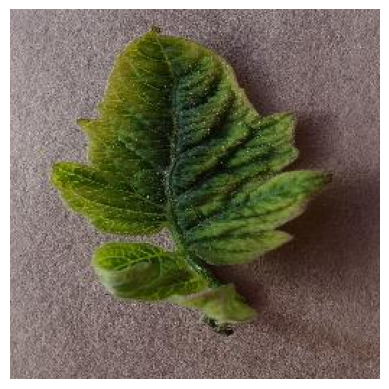

Actual Label: TomatoYellowCurlVirus1.JPG
Predicted: 17


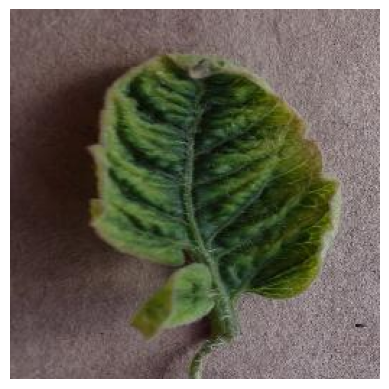

Actual Label: TomatoYellowCurlVirus2.JPG
Predicted: 17


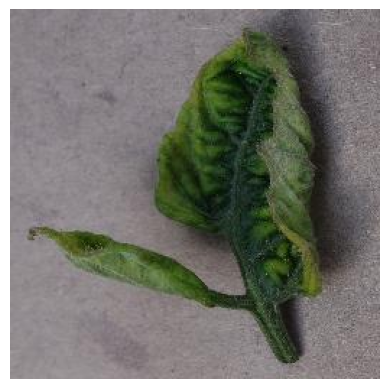

Actual Label: TomatoYellowCurlVirus3.JPG
Predicted: 17


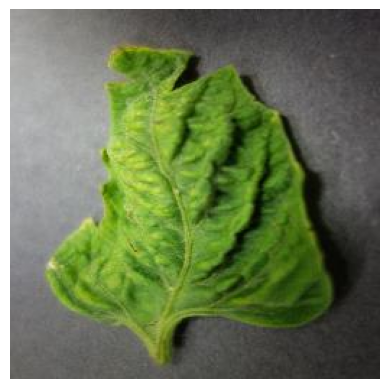

Actual Label: TomatoYellowCurlVirus4.JPG
Predicted: 17


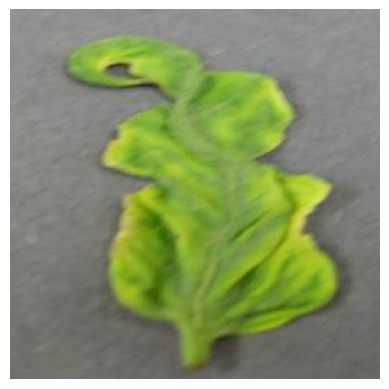

Actual Label: TomatoYellowCurlVirus5.JPG
Predicted: 17


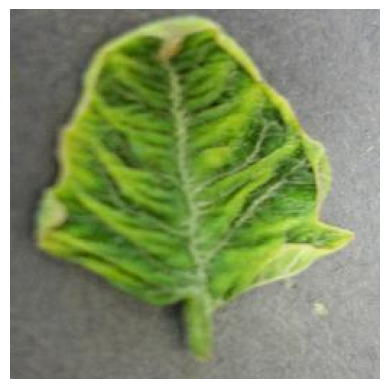

Actual Label: TomatoYellowCurlVirus6.JPG
Predicted: 17


In [54]:
import os
import torch
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms

# Define image transformation (same as during training)
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

])

# Assuming model is already defined and loaded
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()  # Set the model to evaluation mode

# Define the test image directory
test_images_dir = "../data/Leaf/test/"
image_paths = [os.path.join(test_images_dir, fname) for fname in os.listdir(test_images_dir) 
               if fname.lower().endswith(('.jpg', '.png'))]

def predict_image(image, model):
    """Predict the class with the highest probability."""
    img_tensor = transform(image).unsqueeze(0).to(device)
    with torch.no_grad():
        output = model(img_tensor)
        probabilities = torch.nn.functional.softmax(output[0], dim=0)
        predicted_class = torch.argmax(probabilities).item()
    return predicted_class

# Iterate over test images
for image_path in image_paths:
    # Load and display the image
    image = Image.open(image_path).convert('RGB')
    plt.imshow(image)
    plt.axis('off')
    plt.show()

    # Predict the class
    predicted_class = predict_image(image, model)
    actual_label_name = os.path.basename(image_path).split('_')[0]  # Optional

    print(f"Actual Label: {actual_label_name}")
    print(f"Predicted: {predicted_class}")


In [105]:
image_paths = ["../data/Leaf/test/AppleCedarRust2.jpg"]

In [98]:
# print(model.device)
print(input_tensor.device)


cpu


In [99]:
print(next(model.parameters()).device)


cuda:0


In [104]:
# getting all predictions (actual label vs predicted)
for i, (img, label) in enumerate(test):
    print(Fore.GREEN)
    print('Label:', test_images[i], ', Predicted:', predict_image(img, model))


Label: AppleCedarRust1.JPG , Predicted: Apple___healthy

Label: AppleCedarRust2.JPG , Predicted: Tomato___Early_blight


In [53]:
from collections import Counter

predictions = []
for image_path in image_paths:
    image = Image.open(image_path).convert('RGB')
    predicted_class = predict_image(image, model)
    predictions.append(predicted_class)

print("Prediction Counts:", Counter(predictions))


Prediction Counts: Counter({17: 33})
